# Advance Lane Finding Project

Summary:

1. Why do we need Camera Calibration
2. How to identify Lane Line
3. Debugging Tool

In [2]:
import cv2
import numpy as np
import glob  # to store image paths
from utils import mix_color_grad_thresh, weighted_img, region_of_interest, draw_windows
from utils import CameraCalibrator, ProjectionManager, LineTracker
from moviepy.editor import VideoFileClip
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

In [3]:
test_path = 'test_images/'
test_imgs = glob.glob(test_path + "test*.jpg")
print(test_imgs)

['test_images/test6.jpg', 'test_images/test3.jpg', 'test_images/test2.jpg', 'test_images/test7.jpg', 'test_images/test8.jpg', 'test_images/test1.jpg', 'test_images/test16.jpg', 'test_images/test4.jpg', 'test_images/test5.jpg']


## 1. Camera Calibration

Camera calibration is method to correct the distortion due to various factors. In this project, we focus on correction for **radial distortion, and tangential distortion.** One way is to find a **distortion coefficients** of the camera using Chessboards.


![alt-text](https://cloud.githubusercontent.com/assets/13214917/23243156/ecbcf980-f931-11e6-9e3c-f47f111b689b.png)


Camera Calibration data restored from ./camera_cal/calibration_mat.p


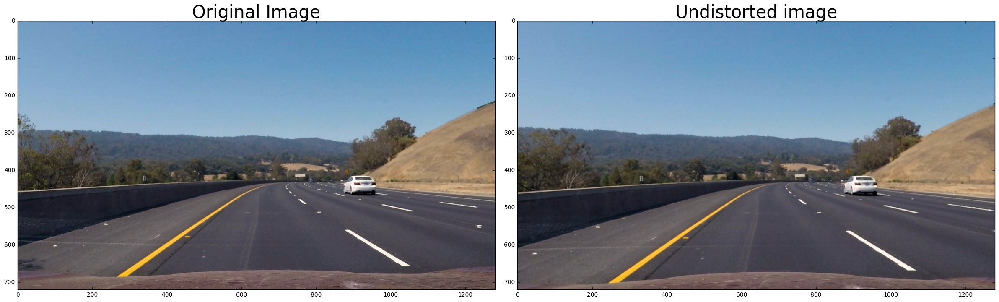

In [4]:
# Example using 1 image
frame = cv2.imread('./test_images/test3.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Calibrate camera
cam_calibration = CameraCalibrator(p_file='./camera_cal/calibration_mat.p', img_dir=None)
mtx, dst, img_size = cam_calibration.get()
row = img_size[0]
col = img_size[1]

# Un-distort image
undst_img = cv2.undistort(frame, mtx, dst)

f, ax = plt.subplots(1, 2, figsize =(24,9))
f.tight_layout()
ax[0].imshow(frame)
ax[0].set_title('Original Image', fontsize=30)
ax[1].imshow(undst_img)
ax[1].set_title('Undistorted image', fontsize=30)

plt.show()


## 2. Extract features from Image

In [5]:
# Sobel Threshold
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Define a function that applies Sobel x or y,
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2, 3) Take the absolute derivative in x or y given orient = 'x' or 'y'
    abs_sobel = None
    if orient is 'x':
        abs_sobel = np.abs(cv2.Sobel(gray, ddepth=cv2.CV_64F, dx=1, dy=0))
    if orient is 'y':
        abs_sobel = np.abs(cv2.Sobel(gray, ddepth=cv2.CV_64F, dx=0, dy=1))
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    if abs_sobel is not None:
        scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
        # 5) Create a mask of 1's where the scaled gradient magnitude
        # masked everything to dark ( = 0)
        abs_sobel_output = np.zeros_like(scaled_sobel)
        # if any pixel has thresh_min < value < thresh_max
        abs_sobel_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
        return abs_sobel_output
    else:
        return None

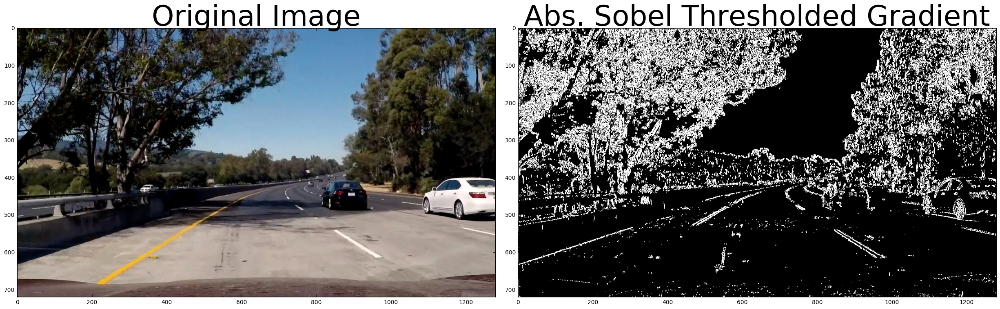

In [6]:
# Read an image
img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Run the function
grad_binary = abs_sobel_thresh(img, orient='x', thresh_min=10, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Abs. Sobel Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

In [7]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):

    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude
    gradient_magnitude = np.sqrt(sobelx ** 2 + sobely ** 2)

    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradient_magnitude) / 255
    gradient_magnitude = np.uint8(gradient_magnitude / scale_factor)

    # 5) Create a binary mask where mag thresholds are met
    mag_binary_output = np.zeros_like(gradient_magnitude)
    mag_binary_output[(gradient_magnitude >= mag_thresh[0]) & (gradient_magnitude <= mag_thresh[1])] = 1
    return mag_binary_output



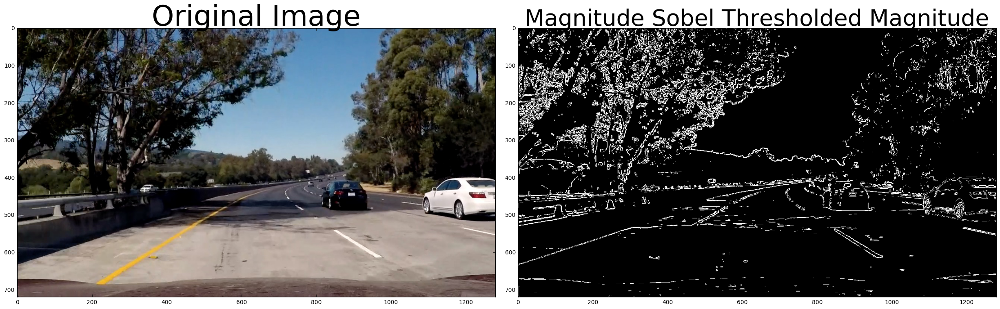

In [8]:
# Read an image
img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Magnitude Sobel Threshold
mag_binary = mag_thresh(img, sobel_kernel=3, mag_thresh=(40, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Magnitude Sobel Thresholded Magnitude', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

In [9]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi / 2)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.abs(sobelx)
    abs_sobely = np.abs(sobely)
    # 4) Calculate the direction of the gradient
    grad_direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    dir_binary_output = np.zeros_like(grad_direction)
    # 6) Return this mask as your binary_output image
    dir_binary_output[(grad_direction >= thresh[0]) & (grad_direction <= thresh[1])] = 1
    return dir_binary_output

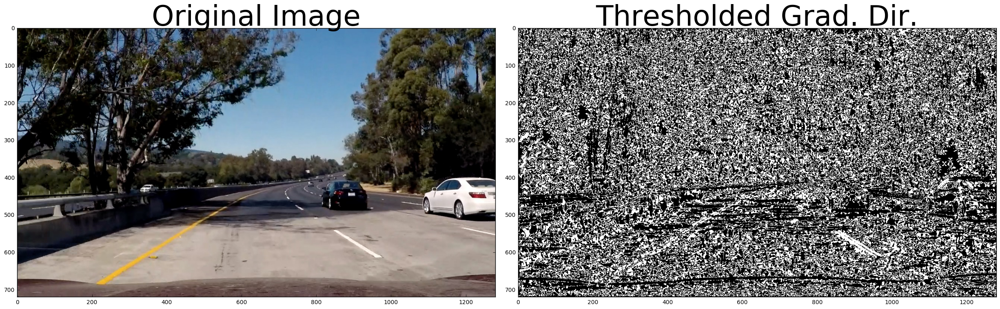

In [10]:
# Read an image
img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Direction Gradient
dir_binary = dir_threshold(img, sobel_kernel=9, thresh=(0.6, 1.3))  # 0.7 --> 1.3 is line angle around 45* -> -45*
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

In [11]:
def hls_select(img, thresh=(0, 255), channel=2):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    s_channel = hls[:, :, channel]  # default is s_channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > thresh[0]) & (s_channel < thresh[1])] = 1
    # 3) Return a binary image of threshold result
    binary_output = s_binary  # placeholder line
    return binary_output



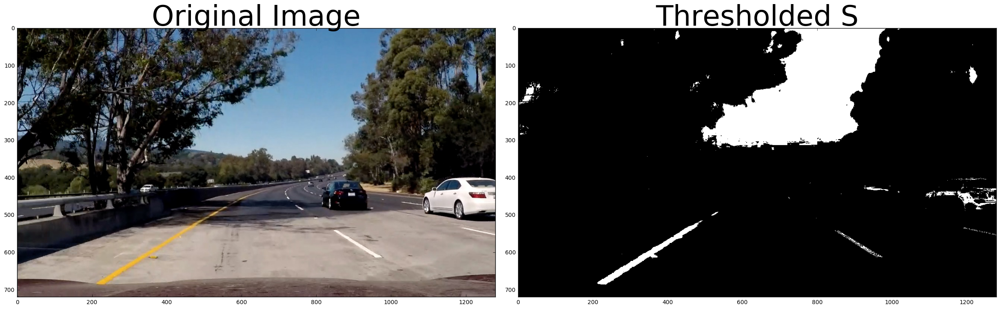

In [12]:
img = cv2.imread('test_images/test5.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

s_binary = hls_select(img, thresh=(88, 250))
h_binary = hls_select(img, thresh=(120, 250),channel=1)

binimg = np.zeros_like(s_binary)
binimg[(s_binary == 1 ) & (h_binary == 1)] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binimg, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

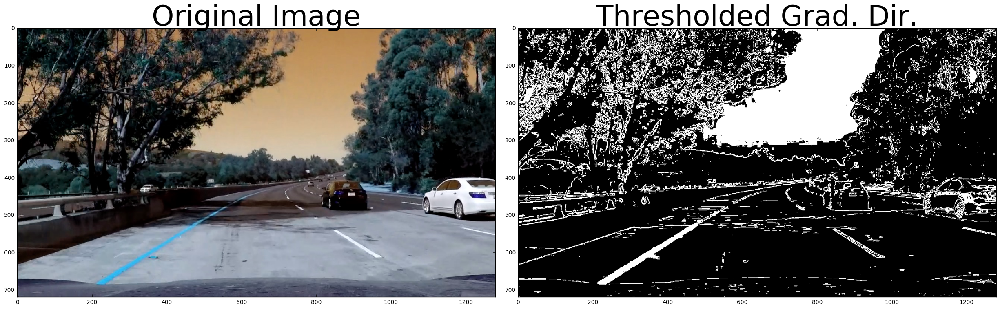

In [16]:
image = cv2.imread('test_images/test5.jpg')
image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


# Sobel Threshold
gradx = abs_sobel_thresh(image, orient='x', thresh_min=30, thresh_max=100)
grady = abs_sobel_thresh(image, orient='y', thresh_min=30, thresh_max=100)
mag_binary = mag_thresh(image, mag_thresh=(30,100), sobel_kernel=15)
dir_binary = dir_threshold(image, thresh=(0.7, 1.3), sobel_kernel=15)

# Color Threshold
s_binary = hls_select(image, thresh=(88, 250))
h_binary = hls_select(image, thresh=(120, 250),channel=1)
binimg = np.zeros_like(s_binary)
binimg[(s_binary == 1 ) & (h_binary == 1)] = 1

# Mix Threshold together
combined = np.zeros_like(dir_binary)
# combined[((gradx == 1) | (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (binimg == 1) ] = 1
combined[((gradx == 1) | (grady == 1)) | (binimg == 1) ] = 1

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

In [ ]:
# Combine everything
# Example using 1 image
frame = cv2.imread('./test_images/test3.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

undst_img = cv2.undistort(frame, mtx, dst)
# Threshold image
binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))

# Display image
f, ax = plt.subplots(1, 2, figsize =(24,9))
f.tight_layout()
ax[0].imshow(undst_img)
ax[0].set_title('Undistored Image', fontsize=30)
ax[1].imshow(binary_img, cmap='gray')
ax[1].set_title('Thresholded Image', fontsize=30)
plt.show()

## 3. Perspective Transform (Bird-Eye View)

In [ ]:
# Define source and destination points
offset = 300
src = np.float32([[[col * 0.05, row],                   # bottom-left
                   [col * 0.95, row],                   # bottom-right
                   [col * 0.60, row * 0.62],            # top-right
                   [col * 0.43, row * 0.62]]])          # top-left

dst = np.float32([[col*0.15 + offset, row],             # bottom left
                  [col*0.90 - offset, row],             # bottom right
                  [col- offset, 0],               # top right
                  [offset, 0]])              # top left

In [ ]:
# Example using 1 image
frame = cv2.imread('./test_images/test8.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Perspective Transform
projmgr = ProjectionManager(cam_calibration, row, col,src, dst, offset=300)

# undst_img = cv2.undistort(frame, mtx, dst)
binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))

# Show what get transformed.
undst_roi = region_of_interest(undst_img, projmgr.get_roi())
binary_roi = region_of_interest(binary_img, projmgr.get_roi())
# Merge to original image
undst_img = cv2.addWeighted(undst_img, 0.5, undst_roi, 0.5, 0.0)
binary_img = cv2.addWeighted(binary_img, 0.5, binary_roi, 0.5, 0.0)

# Convert to Bird-eye view
undst_birdeye = projmgr.get_birdeye_view(undst_img)
binary_birdeye = projmgr.get_birdeye_view(binary_img)


# Display bir
f, ax = plt.subplots(2, 2, figsize=(24, 18))
f.tight_layout()
ax[0, 0].imshow(undst_img)
ax[0, 0].set_title('Original Image', fontsize=30)
ax[0, 1].imshow(undst_birdeye)
ax[0, 1].set_title('Bird-eye View', fontsize=30)
ax[1, 0].imshow(binary_img, cmap='gray')
ax[1, 0].set_title('Thresholded and ROI Cropped', fontsize=30)
ax[1, 1].imshow(binary_birdeye, cmap='gray')
ax[1, 1].set_title('Bird Eye View', fontsize=30)
plt.show()

In [ ]:
# Histogram

In [ ]:
# Now let try in a loop
grid = len(test_imgs)

f, ax = plt.subplots(grid, 4, figsize =(20,20))
f.tight_layout()
for idx, test_img in enumerate(test_imgs):
    img = cv2.imread(test_img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undst_img = adaptive_equalize_image(img, level=3)
    binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))
    # Show what get transformed.
    undst_roi = region_of_interest(undst_img, projmgr.get_roi())
    binary_roi = region_of_interest(binary_img, projmgr.get_roi())
    # Merge to original image
    undst_img = cv2.addWeighted(undst_img, 0.5, undst_roi, 0.5, 0.0)
    binary_img = cv2.addWeighted(binary_img, 0.5, binary_roi, 0.5, 0.0)

    # Convert to Bird-eye view
    undst_birdeye = projmgr.get_birdeye_view(undst_img)
    binary_birdeye = projmgr.get_birdeye_view(binary_img)
    ax[idx, 0].imshow(undst_img)
    ax[idx, 1].imshow(undst_birdeye)
    ax[idx, 2].imshow(binary_img, cmap='gray')
    ax[idx, 3].imshow(binary_birdeye, cmap='gray')
    # Turn off axis
    ax[idx, 0].axis('off'), ax[idx, 1].axis('off'),ax[idx, 2].axis('off'), ax[idx, 3].axis('off')
plt.show()

In [ ]:
# Example using 1 image
frame = cv2.imread('./test_images/test5.jpg')
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

projmgr = ProjectionManager(cam_calibration, row, col,src, dst, offset=300)
# undst_img = cv2.undistort(frame, mtx, dst)
undst_img = frame
binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))
binary_img = region_of_interest(binary_img, projmgr.get_roi())
birdeye_img = projmgr.get_birdeye_view(binary_img)
birdeye_undst = projmgr.get_birdeye_view(undst_img)

# Lane Fitting and Tracking
curve_centers = LineTracker(window_height=80, window_width=25, margin=15, ym=10/720, xm=4/384, smooth_factor=15)
# Sliding window
window_centroids = curve_centers.find_lane_line(warped=birdeye_img)
result, leftx, rightx = draw_windows(birdeye_img, w=25, h=80, window_centroids=window_centroids)

# Curve-fit
lane_lines = curve_centers.curve_fit(result, leftx, rightx)

# Convert back to normal view
#lane_lines = projmgr.get_normal_view(lane_lines)

# Merge to original image
lane_lines = cv2.addWeighted(result, 1.0, lane_lines, 0.5, 0.0)
f, ax = plt.subplots(2, 2, figsize =(24,9))
f.tight_layout()
ax[0, 0].imshow(undst_img)
ax[0, 0].set_title('Original Image')
ax[0, 1].imshow(binary_img, cmap='gray')
ax[0, 1].set_title('Undistorted image')
ax[1, 0].imshow(result, cmap='gray')
ax[1, 0].set_title('Thresholded and ROI Cropped')
ax[1, 1].imshow(lane_lines)
ax[1, 1].set_title('Bird Eye View')
plt.show()

In [ ]:
# Now let try in a loop
grid = len(test_imgs)

f, ax = plt.subplots(grid, 4, figsize =(20,20))
f.tight_layout()
for idx, test_img in enumerate(test_imgs):
    img = cv2.imread(test_img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undst_img = adaptive_equalize_image(img, level=3)
    binary_img = mix_color_grad_thresh(undst_img, s_thresh=(180, 255), grad_thresh=(40, 90))
    binary_img = region_of_interest(binary_img, projmgr.get_roi())
    birdeye_img = projmgr.get_birdeye_view(binary_img)
    birdeye_undst = projmgr.get_birdeye_view(undst_img)
    # Lane Fitting and Tracking
    curve_centers = LineTracker(window_height=80, window_width=25, margin=15, ym=10/720, xm=4/384, smooth_factor=15)
    # Sliding window
    window_centroids = curve_centers.find_lane_line(warped=birdeye_img)
    result, leftx, rightx = draw_windows(birdeye_img, w=25, h=80, window_centroids=window_centroids)
    # Curve-fit
    lane_lines = curve_centers.curve_fit(result, leftx, rightx)
    # Merge to original image
    lane_lines = cv2.addWeighted(result, 1.0, lane_lines, 0.5, 0.0)
    # Convert to Bird-eye view
    undst_birdeye = projmgr.get_birdeye_view(undst_img)
    binary_birdeye = projmgr.get_birdeye_view(binary_img)
    ax[idx, 0].imshow(undst_img)
    ax[idx, 1].imshow(undst_birdeye)
    ax[idx, 2].imshow(birdeye_img, cmap='gray')
    ax[idx, 3].imshow(lane_lines)
    # Turn off axis
    ax[idx, 0].axis('off'), ax[idx, 1].axis('off'),ax[idx, 2].axis('off'), ax[idx, 3].axis('off')
plt.show()

## 3. Diagnostic Screen